# MEMORABILITY PREDICTION

One remarkable feature of human cognition is the ability to recall thousands of different images, some in great detail, after only a single viewing. In fact, not all images are remembered in the same way by the human brain. Some images stay with us for a long time, while others fade away quickly. Memorability assesses how easily an image can be remembered after a quick glance. This type of capacity, like some subjective image properties, is likely to be influenced by individual experiences and is also subject to some degree of inter-subject variability.The image memorability of outdoor natural scenes, which appear frequently in human life, is critical. Understanding and predicting the memorability of natural outdoor scenes may have some applications.

* ***memorable cover images***
* ***tourism advertisements***
* ***impressive background or cover photo***


*References*
* Understanding and Predicting the Memorability of Outdoor Natural Scenes Jiaxin Lu , Mai Xu , Senior     Member, IEEE, Ren Yang , and Zulin Wang,
* Predicting the Memorability of Natural-scene Images Jiaxin Lu 1, Mai Xu 1, Zulin Wang 1,2
* What makes an image memorable? Phillip Isola Jianxiong Xiao Antonio Torralba Aude Oliva


In [1]:
 import numpy as np
from scipy import io

***This code includes imports for various libraries in Python. It covers modules for file system operations (os), scientific computing (scipy), computer vision (cv2), numerical operations (numpy), machine learning (tensorflow), data augmentation and preprocessing for images (ImageDataGenerator), a pre-trained deep learning model (ResNet50), tools for creating and training neural networks (Model, GlobalAveragePooling2D, Dense, Sequential, Adam), and metrics for regression analysis (r2_score). Additionally, it imports a module for data splitting in machine learning (train_test_split).***

In [3]:
import os
from scipy import io
import cv2

import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from sklearn.metrics import r2_score
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization


from sklearn.model_selection import train_test_split

***Loading the memorability scores which is in a MATLAB file named actual_hrs.mat using the loadmat function from the scipy.io module.***

In [85]:
real_data=io.loadmat('/kaggle/input/nsim-dataset/NSIM-dataset/data/actual_hrs.mat')

In [86]:
type(real_data)

dict

In [87]:
real_data.keys()

dict_keys(['__header__', '__version__', '__globals__', 'actual_hrs'])

In [88]:
actual_hrs=real_data['actual_hrs']

In [89]:
actual_hrs.shape

(258, 1)

 loading and preparing a set of images from a specified folder

In [9]:
image_folder = '/kaggle/input/nsim-dataset/NSIM-dataset/images'

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.resize(img, (224, 224))  # Resize to a fixed size for the model
            images.append(img)
    return images

nature_images = load_images_from_folder(image_folder)


In [10]:
nature_images[1].shape

(224, 224, 3)

***converting the list of loaded images (nature_images) into a NumPy array named train and normalizing the pixel***


In [11]:
train = np.array(nature_images)

# Normalize pixel values to range [0, 1]
train = train.astype('float32') / 255.0

*spliting the data into training and validation sets*

In [12]:
trainX, valX,trainy, valy = train_test_split(train, actual_hrs, test_size=0.2, random_state=42)

***train_generator is created using datagen.flow() with the training data (trainX and trainy) and a batch size of 32. Similarly, val_generator is created using the validation data (valX and valy) with the same batch size of 32. These generators will provide augmented data batches during model training and validation.***

***ImageDataGenerator in TensorFlow/Keras for image augmentation. This generator is used to apply various transformations to input images before they are fed into a neural network for training.***

In [13]:
datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = datagen.flow(trainX,trainy, batch_size=32)
val_generator = datagen.flow(valX, valy, batch_size=32)

***creating a new neural network model for memorability prediction. It uses a pre-trained ResNet50 as a base model with the top layers removed. On top of the base model, a Global Average Pooling layer is added, followed by two fully connected layers. The final layer has one neuron as memorability score is a regression task.***

![0*tH9evuOFqk8F41FG.png](http://miro.medium.com/v2/resize:fit:1400/format:webp/0*tH9evuOFqk8F41FG.png)

In [14]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Created a new model for memorability prediction
res_model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='linear')  # Memorability score is a regression task
])


for layer in base_model.layers[-4:]:
    layer.trainable = True

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9
)

res_model.compile(optimizer=Adam(lr=lr_schedule), loss='mean_squared_error', metrics=['RootMeanSquaredError']) 

# Train the model
res_model.fit(train_generator, validation_data=val_generator, epochs=10)

94765736/94765736 [==============================] - 0s 0us/step
Epoch 1/10
7/7 [==============================] - 55s 8s/step - loss: 0.3366 - root_mean_squared_error: 0.5802 - val_loss: 8160.9663 - val_root_mean_squared_error: 90.3381
Epoch 3/10
7/7 [==============================] - 54s 8s/step - loss: 0.3220 - root_mean_squared_error: 0.5675 - val_loss: 8904.0361 - val_root_mean_squared_error: 94.3612
Epoch 4/10
7/7 [==============================] - 55s 8s/step - loss: 0.3741 - root_mean_squared_error: 0.6117 - val_loss: 2514189.7500 - val_root_mean_squared_error: 1585.6196
Epoch 5/10
7/7 [==============================] - 54s 8s/step - loss: 0.1325 - root_mean_squared_error: 0.3640 - val_loss: 9721569.0000 - val_root_mean_squared_error: 3117.9431
Epoch 6/10
7/7 [==============================] - 55s 9s/step - loss: 0.1601 - root_mean_squared_error: 0.4001 - val_loss: 59903.9766 - val_root_mean_squared_error: 244.7529
Epoch 7/10
7/7 [==============================] - 55s 8s/step -

***evaluating the model's performance on the validation data. It computes the test loss and root mean squared error (RMSE) using the evaluate() method with valX and valy.***

In [15]:
test_loss, rmse = res_model.evaluate(valX, valy)
print("Test Loss:", test_loss)
print("RMSE:", rmse)

2/2 [==============================] - 3s 1s/step - loss: 1.6582 - root_mean_squared_error: 1.2877
Test Loss: 1.6582221984863281
RMSE: 1.2877197265625


***Lower values for both metrics are generally indicative of better performance.***

In [16]:
from sklearn.metrics import r2_score


pred = res_model.predict(valX)

# Calculate R2 score
r2 = r2_score(valy, pred)

# Print R2 score
print("R2 Score:", r2)

2/2 [==============================] - 4s 1s/step
R2 Score: -80.8302475136018


***An R2 score indicates that the model is performing very poorly on the given data, as it is providing a negative contribution to the prediction.***

***XGBoost is a powerful tool for regression and classification tasks, known for its high performance and efficiency.***

In [17]:
import xgboost as xgb
from sklearn.metrics import r2_score


***using the trained res_model to generate predictions for the training set (trainX) and the validation set (valX).***

In [18]:
features_train = res_model.predict(trainX)
features_test = res_model.predict(valX)

2/2 [==============================] - 3s 1s/step


***Employs the XGBoost regressor to train a model on the features obtained from the previous neural network. The trained XGBoost model is used to make predictions for both the training and test sets.***

In [19]:
xgb_model = xgb.XGBRegressor()
xgb_model.fit(features_train, trainy)
xgb_predictions_train = xgb_model.predict(features_train)
xgb_predictions_test = xgb_model.predict(features_test)

In [22]:
r2_xgb_train = r2_score(trainy, xgb_predictions_train)
r2_xgb_test = r2_score(valy, xgb_predictions_test)

In [23]:
print("R2 Score (XGBoost - Train):", r2_xgb_train)
print("R2 Score (XGBoost - Test):", r2_xgb_test)

R2 Score (XGBoost - Train): 0.9760866569914797
R2 Score (XGBoost - Test): -0.6375342386440175


**SVR**

***Support Vector Regression (SVR) is a machine learning algorithm used for regression tasks. It works by finding the hyperplane that best fits the data while minimizing errors, and it can handle both linear and non-linear relationships between input and output variables.***

In [24]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, r2_score

In [25]:
# Convert images to a 4D numpy array
train = np.array(nature_images)

# Get the number of images, height, width, and channels
num_images, height, width, channels = train.shape

# Flatten each image
train = train.reshape((num_images, height * width * channels))

# Normalize pixel values to range [0, 1]
train = train.astype('float32') / 255.0

In [26]:
Svr_model = SVR(kernel='linear')

In [27]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
TrainX, TestX, Trainy, Testy = train_test_split(train, actual_hrs, test_size=0.2, random_state=42)


***using the Support Vector Regressor (SVR) model and training it on your entire dataset (train) with corresponding memorability scores (actual_hrs)***

In [28]:
Svr_model.fit(TrainX, Trainy)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(kernel='linear')

***Calculating and printing the Root Mean Squared Error (RMSE) and R2 score between actual memorability scores and predictions obtained from an SVR model trained***

In [29]:
from sklearn.metrics import mean_squared_error, r2_score





# Predict using your SVR model
predictions = Svr_model.predict(TestX)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(Testy, predictions))

# Calculate R2 score
r2 = r2_score(Testy, predictions)

print(f'RMSE: {rmse}')
print(f'R2 Score: {r2}')


RMSE: 0.152474018578961
R2 Score: -0.14726259572127898


In [30]:
svr_predictions_train = Svr_model.predict(TrainX)
svr_predictions_test = Svr_model.predict(TestX)

In [31]:
TrainX_with_svr = np.concatenate((TrainX, svr_predictions_train.reshape(-1, 1)), axis=1)
TestX_with_svr = np.concatenate((TestX, svr_predictions_test.reshape(-1, 1)), axis=1)

In [32]:
xgb_model = xgb.XGBRegressor()
xgb_model.fit(TrainX_with_svr, Trainy)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [33]:
xgb_predictions_test = xgb_model.predict(TestX_with_svr)
rmse_xgb_test = np.sqrt(mean_squared_error(Testy, xgb_predictions_test))
r2_xgb_test = r2_score(Testy, xgb_predictions_test)
print("RMSE (XGBoost with SVR - Test):", rmse_xgb_test)
print("R2 Score (XGBoost with SVR - Test):", r2_xgb_test)

RMSE (XGBoost with SVR - Test): 0.16385662926708505
R2 Score (XGBoost with SVR - Test): -0.32494903898424643


# REASONS 
* ***Complexity of the Dataset: Natural scene images can be highly complex, containing various objects, textures, and lighting conditions. If the dataset is particularly challenging, even advanced models like ResNet50 may struggle to capture all the nuances.***
* ***Insufficient Data: Deep learning models, especially those like ResNet50, typically require large amounts of data to generalize well. If the dataset is small or lacks diversity, the model may overfit or fail to learn the underlying patterns.***
* ***Model Architecture Choices: Even within a model family (e.g., deep learning models), different architectures may perform differently on different types of data. It's possible that ResNet50, while powerful, may not be the best choice for this specific dataset.***

# Using Individual Features

* *Instead of using the entire image, we'll extract specific features to improve model performance. This approach aims to focus on capturing specific characteristics or attributes of the data that are relevant to the task at hand. This may include texture descriptors, color histograms, edge detectors, or any other domain-specific features.*

* *By doing so, we aim to provide the model with more meaningful information that could lead to better predictive performance, especially if the original image data proved challenging for the chosen models (e.g., ResNet50 and SVR).*


# **HSV BASED**

***Importing the OpenCV library using 'import cv2.'
Defining a function 'convert_rgb_to_hsv' that takes a list of images as input.
Using list comprehension to convert each RGB image to HSV using 'cv2.cvtColor.'
Returning a list of HSV images.
Applying the 'convert_rgb_to_hsv' function to a list of images ('nature_images') and storing the result in 'hsv_images.'***

In [34]:
import cv2

def convert_rgb_to_hsv(images):
    hsv_images = [cv2.cvtColor(image, cv2.COLOR_BGR2HSV) for image in images]
    return hsv_images


hsv_images = convert_rgb_to_hsv(nature_images)

***Data Processing***

In [35]:
hsv_images[0]

array([[[140,   7, 231],
        [145,   7, 227],
        [141,   8, 223],
        ...,
        [115,  23, 204],
        [115,  23, 204],
        [115,  22, 205]],

       [[139,   9, 227],
        [139,   9, 228],
        [141,   8, 224],
        ...,
        [117,  23, 197],
        [115,  23, 196],
        [115,  24, 195]],

       [[138,  11, 222],
        [136,  13, 224],
        [136,  13, 218],
        ...,
        [118,  25, 191],
        [118,  26, 189],
        [118,  26, 188]],

       ...,

       [[ 65, 102,  30],
        [ 57, 234,  12],
        [ 46, 179,  30],
        ...,
        [ 18, 214, 100],
        [ 18, 219, 105],
        [ 18, 193, 124]],

       [[ 63, 196,  13],
        [ 53, 215,  19],
        [ 46, 181,  31],
        ...,
        [ 17, 234,  86],
        [ 16, 249,  81],
        [ 15, 228,  85]],

       [[ 58, 207,  16],
        [ 52,  69,  67],
        [ 44,  83,  71],
        ...,
        [ 16, 190, 102],
        [ 15, 211,  87],
        [  8, 250,  50]]

In [36]:
hsv_images[0].shape

(224, 224, 3)

* Defining a 'preprocess_image' function that takes 'image_data,' 'output_height,' and 'output_width' as parameters.
* Inside the function:
* Decoding the image and ensuring it has 3 channels.
* Resizing the image to the specified 'output_height' and 'output_width.'
* Normalizing pixel values to be in the range [0, 1].
* Specifying 'output_height' and 'output_width.'
* Applying the 'preprocess_image' function to a list of 'hsv_images' using list comprehension, resulting in 'hsv_processed.'*

In [37]:
def preprocess_image(image_data, output_height, output_width):
    # Decode the image and ensure it has 3 channels
    
    # Resize the image
    image = tf.image.resize(image_data, [output_height, output_width])
    # Normalize the pixel values to be in the range [0, 1]
    image = tf.cast(image, tf.float32) / 255.0
    return image

# Define output size
output_height = 224
output_width = 224

hsv_processed = [preprocess_image(tf.convert_to_tensor(image_data), output_height, output_width) for image_data in hsv_images]

In [38]:
len(hsv_processed)

258

In [39]:
import tensorflow.keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization


In [40]:
import os
from scipy import io
import cv2

import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from sklearn.metrics import r2_score


from sklearn.model_selection import train_test_split

In [41]:
 hsv_features= np.array(hsv_processed)

In [42]:
hsv_features[1].shape

(224, 224, 3)

***Resnet50***

In [43]:
X_train, X_test, y_train, y_test = train_test_split( hsv_features, actual_hrs, test_size=0.2, random_state=42)

In [44]:
datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input
)

Train_generator = datagen.flow(X_train, y_train, batch_size=32)
Val_generator = datagen.flow(X_test, y_test, batch_size=32)

In [45]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Create a new model for memorability prediction
Model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(1024, activation='relu'),
    Dense(1, activation='linear')  # Memorability score is a regression task
])

# Freeze the pre-trained layers and compile the model
for layer in base_model.layers:
    layer.trainable = False

Model.compile(optimizer=Adam(lr=0.001), loss='mean_squared_error', metrics=['RootMeanSquaredError', 'mean_absolute_error'])


# Train the model
Model.fit(Train_generator, validation_data=Val_generator, epochs=10)

Epoch 1/10
7/7 [==============================] - 19s 2s/step - loss: 2.7774 - root_mean_squared_error: 1.6666 - mean_absolute_error: 1.4883 - val_loss: 0.0904 - val_root_mean_squared_error: 0.3006 - val_mean_absolute_error: 0.2659
Epoch 2/10
7/7 [==============================] - 15s 2s/step - loss: 0.8687 - root_mean_squared_error: 0.9320 - mean_absolute_error: 0.8090 - val_loss: 0.9009 - val_root_mean_squared_error: 0.9492 - val_mean_absolute_error: 0.9383
Epoch 3/10
7/7 [==============================] - 15s 2s/step - loss: 0.5101 - root_mean_squared_error: 0.7142 - mean_absolute_error: 0.6404 - val_loss: 0.5657 - val_root_mean_squared_error: 0.7521 - val_mean_absolute_error: 0.7379
Epoch 4/10
7/7 [==============================] - 15s 2s/step - loss: 0.2669 - root_mean_squared_error: 0.5166 - mean_absolute_error: 0.4680 - val_loss: 0.0895 - val_root_mean_squared_error: 0.2991 - val_mean_absolute_error: 0.2633
Epoch 5/10
7/7 [==============================] - 15s 2s/step - loss: 0.

In [46]:
test_loss, rmse,mae = Model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("RMSe:", rmse)
print("MAE:",mae)

2/2 [==============================] - 3s 1s/step - loss: 0.1219 - root_mean_squared_error: 0.3492 - mean_absolute_error: 0.3189
Test Loss: 0.12194868177175522
RMSe: 0.34921151399612427
MAE: 0.3189251124858856


***SVR***

In [47]:
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, r2_score

In [48]:
flattened_hsv_features = [image.flatten() for image in hsv_features]

In [49]:
X = np.array(flattened_hsv_features)

In [50]:
type(X)

numpy.ndarray

In [51]:
X.shape

(258, 150528)

In [52]:
len(X)

258

In [53]:
svr_model = SVR(kernel='linear')

In [54]:
svr_model.fit(X, actual_hrs)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(kernel='linear')

In [55]:
x_train, x_test, Y_train, Y_test = train_test_split(X, actual_hrs, test_size=0.2, random_state=42)

In [56]:
Y_pred = svr_model.predict(x_test)

In [57]:
mae = mean_absolute_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)


In [58]:
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R-squared (R2) Score: {r2}")

Mean Absolute Error (MAE): 0.07712659204619324
R-squared (R2) Score: 0.6527397292457027


***SPATIAL HISTOGRAMS***

In [59]:
from skimage.feature import hog

In [60]:
def extract_hog_features(image):
    # If the image is color, convert it to grayscale
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    fd, _ = hog(gray, orientations=8, pixels_per_cell=(8, 8), cells_per_block=(1, 1), visualize=True)
    return fd

In [61]:
spatial_histograms = [extract_hog_features(image) for image in nature_images]

In [62]:
len(spatial_histograms)

258

In [63]:
spatial_histograms[1].shape

(6272,)

In [64]:
spatial_histograms_array = np.array(spatial_histograms)

In [65]:
actual_hrs.shape


(258, 1)

In [66]:
spatial_histograms_flat = spatial_histograms_array.reshape(spatial_histograms_array.shape[0], -1)

In [67]:
X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(spatial_histograms, actual_hrs, test_size=0.2, random_state=42)

In [68]:
svr_regressor = SVR(kernel='linear')  # You can choose a different kernel if needed
svr_regressor.fit(X_train_data, y_train_data)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(kernel='linear')

In [69]:
y_pred_data = svr_regressor.predict(X_test_data)
from sklearn.metrics import mean_squared_error, r2_score



# Calculate Mean Squared Error
mse = mean_squared_error(y_test_data, y_pred_data)
print(f"Mean Squared Error: {mse}")

mae = mean_absolute_error(y_test_data, y_pred_data)
print(f"Mean Absolute Error: {mae}")


Mean Squared Error: 0.021023517866357307
Mean Absolute Error: 0.12386796870807795


# REASONS
* ***Limited Discriminative Power: HSV-based features and spatial histograms may not capture the discriminative information required for the specific task. For example, they might not be able to differentiate between classes effectively.***
* ***Inappropriate Model: The choice of model might not be suitable for the specific characteristics of the dataset, even when working with engineered features.***

# **DATA EXPLORATION**

***Saving  images***

In [70]:

image_folder_path = '/kaggle/input/nsim-dataset/NSIM-dataset/images'
images = [os.path.join(image_folder_path, img) for img in os.listdir(image_folder_path)]

In [71]:
image_scores = {}

for img_path, score in zip(images, actual_hrs):
    image_scores[img_path] = score

***Utilizing the VGG16 model, pre-trained on the ImageNet dataset, for feature extraction. It then applies K-means clustering to group similar feature vectors into a specified number of clusters (in this case, 20).***

![1*NNifzsJ7tD2kAfBXt3AzEg.png](https://miro.medium.com/v2/resize:fit:1400/format:webp/1*NNifzsJ7tD2kAfBXt3AzEg.png)

In [72]:
import numpy as np
from sklearn.cluster import KMeans
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2

# Load pre-trained VGG16 model
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('fc2').output)  # Output from the second last layer


image_folder_path = '/kaggle/input/nsim-dataset/NSIM-dataset/images'
images = [os.path.join(image_folder_path, img) for img in os.listdir(image_folder_path)]

# 'images' is a list of 258 image file paths
feature_vectors = []

for img_path in images:
    img = cv2.imread(img_path)
    
    if img is not None:  # Check if the image was successfully loaded
        img = cv2.resize(img, (224, 224))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = np.expand_dims(img, axis=0)
        img = preprocess_input(img)
        features = model.predict(img)
        feature_vectors.append(features)

# Convert feature_vectors to numpy array
feature_vectors = np.concatenate(feature_vectors, axis=0)

# Apply K-means clustering
num_clusters = 20  # You can adjust this based on your specific needs
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
clusters = kmeans.fit_predict(feature_vectors)

# 'clusters' now contains the cluster assignments for each image


1/1 [==============================] - 0s 227ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


***generating a visualization of sample images from each cluster produced by the previous code. It employs matplotlib to create a grid of sample images, where each row corresponds to a cluster, and the columns display three sample images per cluster.***

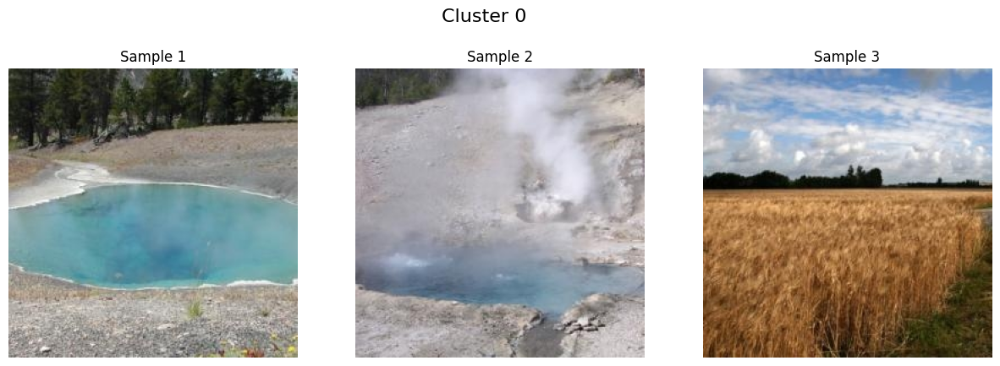

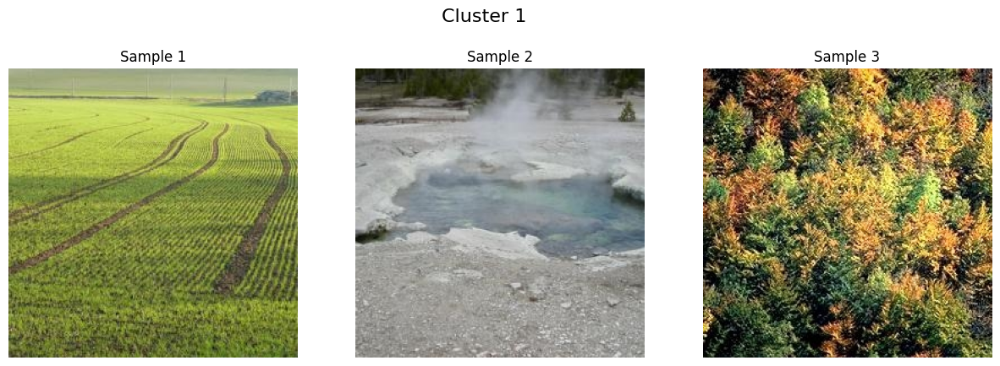

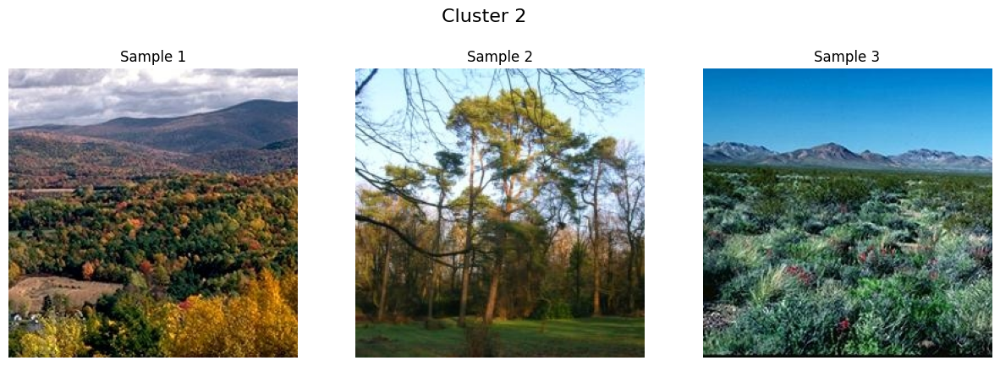

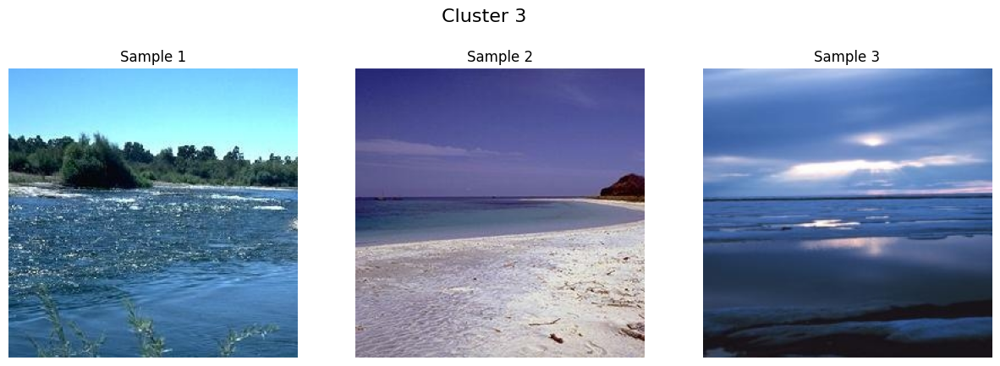

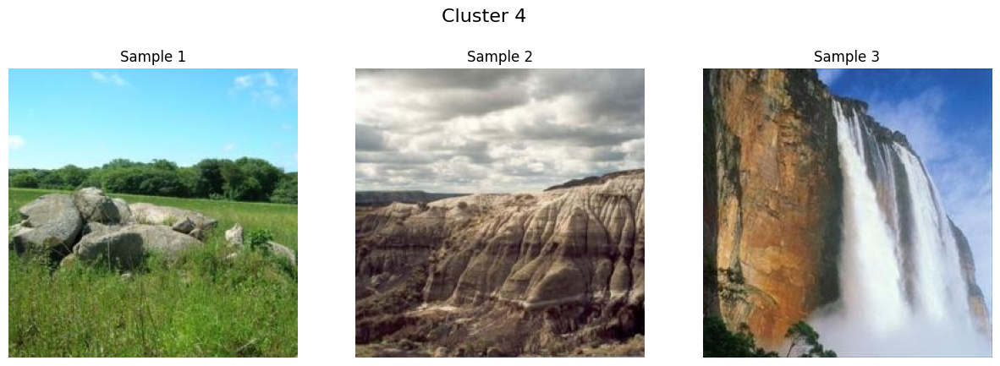

...

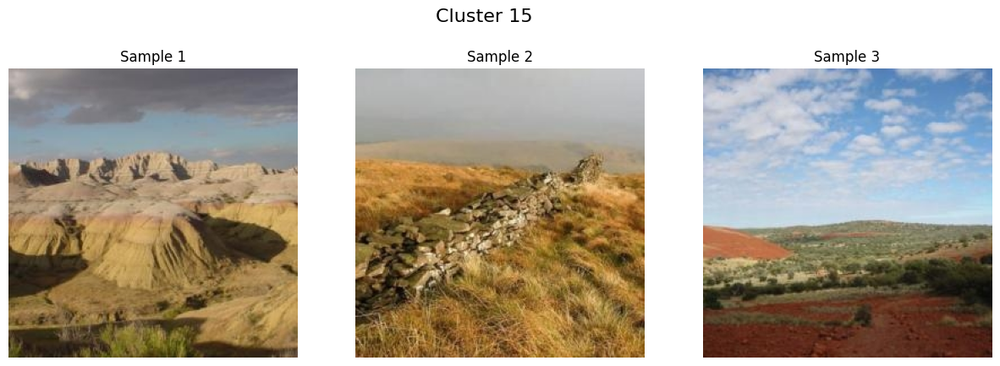

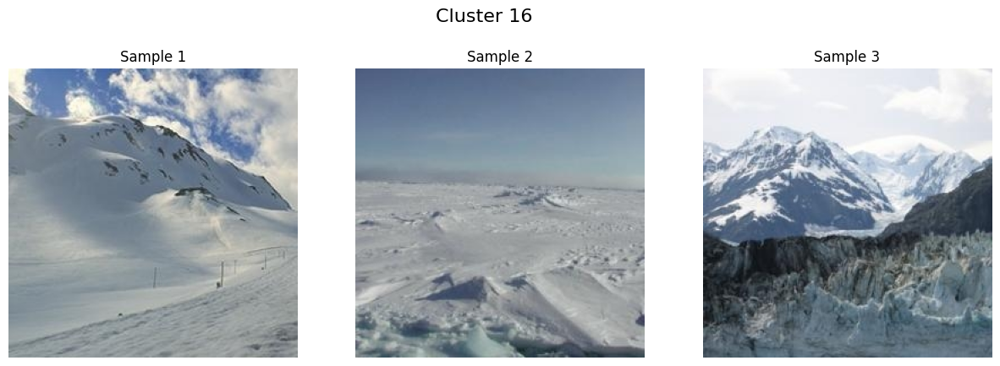

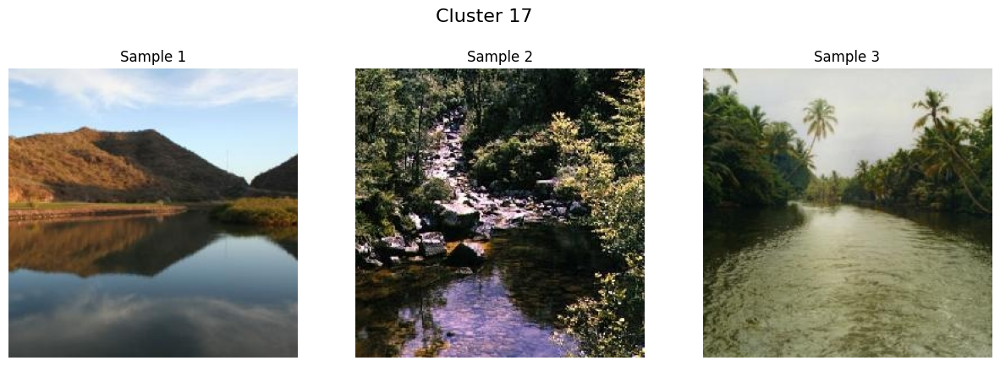

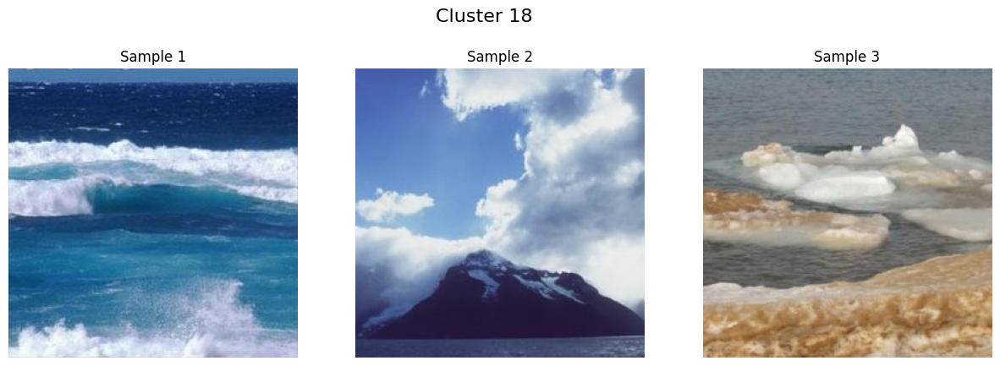

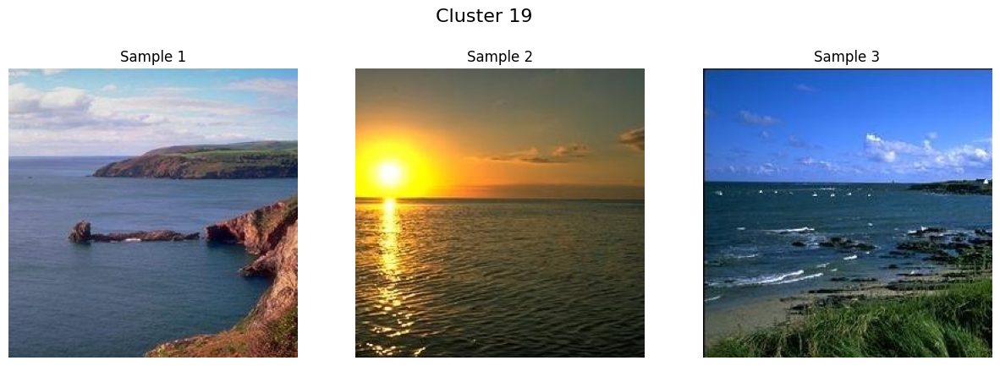

In [73]:
import matplotlib.pyplot as plt



# Creating a dictionary to store sample images for each cluster
sample_images = {}

for cluster_idx in range(num_clusters):
    cluster_indices = np.where(clusters == cluster_idx)[0]  # Get indices of images belonging to the cluster
    if len(cluster_indices) > 0:
        sample_image_indices = cluster_indices[:3]  # Select the first three images as samples (you can change this number)
        sample_images[cluster_idx] = [images[i] for i in sample_image_indices]

# for Display of the sample images
for cluster_idx, sample_image_paths in sample_images.items():
    plt.figure(figsize=(15, 5))
    for i, sample_image_path in enumerate(sample_image_paths):
        img = cv2.imread(sample_image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(f'Sample {i+1}')
        plt.axis('off')
    
    plt.suptitle(f'Cluster {cluster_idx}', fontsize=16)
    plt.show()


***Calculating the average memorability scores for each cluster***

In [74]:


# Create a list to store memorability scores for each cluster
cluster_scores = [[] for _ in range(num_clusters)]

for img_path, cluster_idx in zip(images, clusters):
    memorability_score = image_scores.get(img_path)
    if memorability_score is not None:
        cluster_scores[cluster_idx].append(memorability_score)

# Calculate average scores for each cluster
average_scores = [np.mean(scores) if scores else None for scores in cluster_scores]

# 'average_scores' now contains the average memorability score for each cluster


***employing matplotlib to generate a bar chart representing the average memorability scores for each cluster***

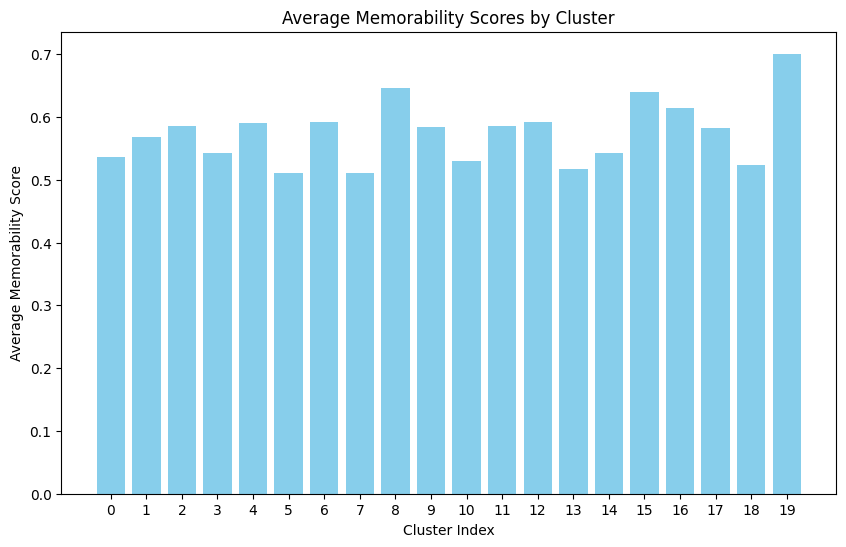

In [75]:
import matplotlib.pyplot as plt

# Create a list of cluster indices for x-axis
cluster_indices = list(range(num_clusters))

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(cluster_indices, average_scores, color='skyblue')
plt.xlabel('Cluster Index')
plt.ylabel('Average Memorability Score')
plt.title('Average Memorability Scores by Cluster')
plt.xticks(cluster_indices)
plt.show()


***displaying images from cluster 19***

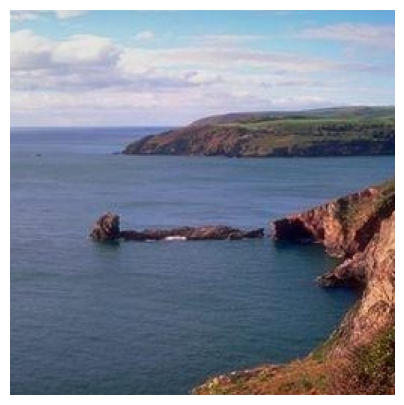

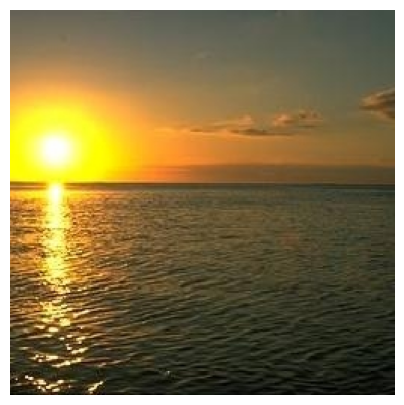

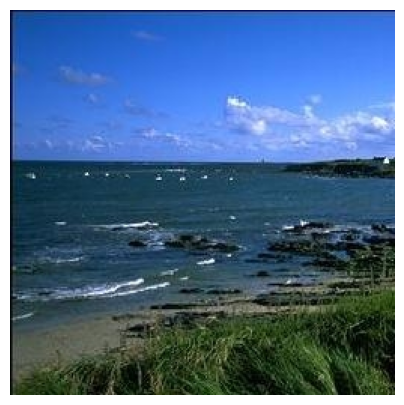

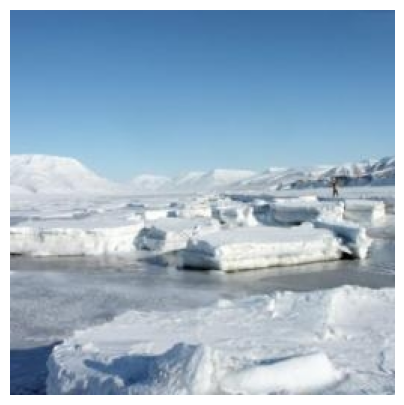

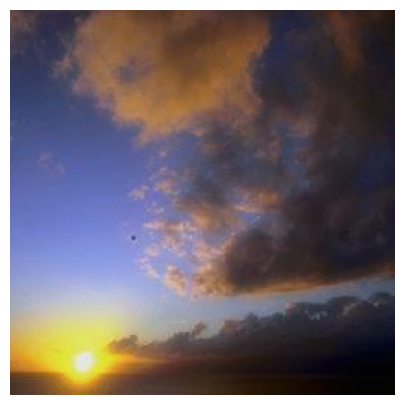

In [76]:


cluster_idx = 19  

# Get indices of images belonging to cluster 19
cluster_indices = np.where(clusters == cluster_idx)[0]

# Select the first three images as samples (you can change this number)
sample_image_indices = cluster_indices[:]

# Get the paths of sample images
sample_images_paths = [images[i] for i in sample_image_indices]

# Display the sample images
for img_path in sample_images_paths:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis('off')


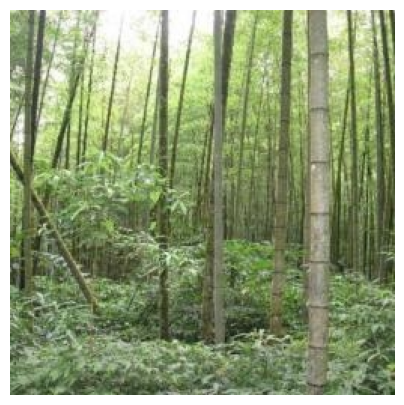

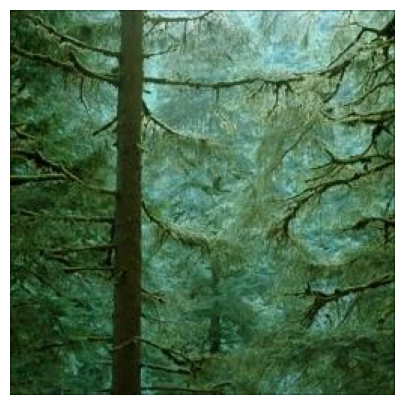

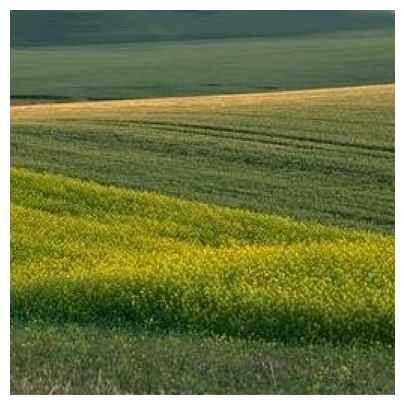

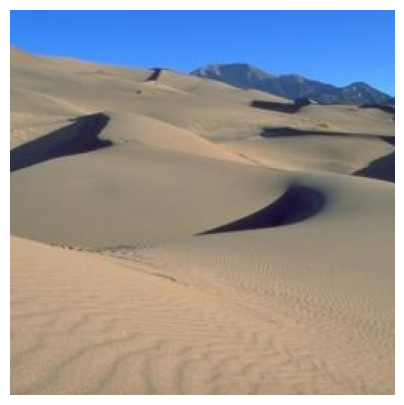

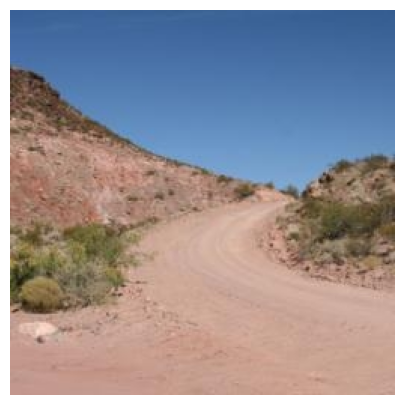

In [77]:

cluster_idx = 8  

# Get indices of images belonging to cluster 19
cluster_indices = np.where(clusters == cluster_idx)[0]

# Select the first three images as samples (you can change this number)
sample_image_indices = cluster_indices[:]

# Get the paths of sample images
sample_images_paths = [images[i] for i in sample_image_indices]

# Display the sample images
for img_path in sample_images_paths:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis('off')

***utilizing OpenCV and scikit-learn to analyze dominant colors in images. It defines functions to calculate the dominant color and count images with green or blue dominance in a specified folder.***

In [78]:

import os
import cv2
import numpy as np

# Define paths
image_dir = '/kaggle/input/nsim-dataset/NSIM-dataset/images'
actual_hrs = [...]  # Your array of memorability scores

# Load images and memorability scores
images = []
for filename in os.listdir(image_dir):
    img_path = os.path.join(image_dir, filename)
    
    # Check if the file is a valid image
    if not os.path.isfile(img_path) or not img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue
    
    image = cv2.imread(img_path)
    
    # Check if the image was loaded successfully
    if image is not None:
        images.append(image)
    else:
        print(f"Error loading image: {img_path}")

# Convert images to RGB format (if not already)
images = [cv2.cvtColor(image, cv2.COLOR_BGR2RGB) for image in images]

# Convert images to numpy array for further processing
images = np.array(images)


***creating a list of tuples, where each tuple contains an element from the actual_hrs list and its corresponding element from the images list.***

In [79]:

scores_images = list(zip(actual_hrs, images))


***Utilizing OpenCV and Matplotlib to perform color clustering on an image. It loads an image, applies K-means clustering to identify dominant colors***

1. RGB(41, 43, 19)
2. RGB(177, 169, 115)
3. RGB(220, 213, 188)
4. RGB(135, 132, 80)
5. RGB(91, 92, 48)


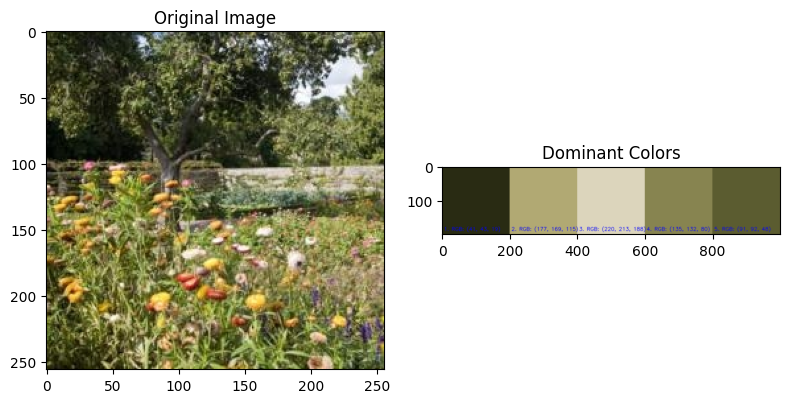

In [80]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def create_bar(height, width, color):
    bar = np.zeros((height, width, 3), np.uint8)
    bar[:] = color
    red, green, blue = int(color[2]), int(color[1]), int(color[0])
    return bar, (red, green, blue)

img = cv2.imread('/kaggle/input/nsim-dataset/NSIM-dataset/images/0015.jpg')
height, width, _ = np.shape(img)

data = np.reshape(img, (height * width, 3))
data = np.float32(data)

number_clusters = 5
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
flags = cv2.KMEANS_RANDOM_CENTERS
compactness, labels, centers = cv2.kmeans(data, number_clusters, None, criteria, 10, flags)

font = cv2.FONT_HERSHEY_SIMPLEX
bars = []
rgb_values = []

for index, row in enumerate(centers):
    bar, rgb = create_bar(200, 200, row)
    bars.append(bar)
    rgb_values.append(rgb)

img_bar = np.hstack(bars)

for index, row in enumerate(rgb_values):
    image = cv2.putText(img_bar, f'{index + 1}. RGB: {row}', (5 + 200 * index, 200 - 10),
                        font, 0.5, (255, 0, 0), 1, cv2.LINE_AA)
    print(f'{index + 1}. RGB{row}')

# Display the original image
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

# Display the dominant colors
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_bar, cv2.COLOR_BGR2RGB))
plt.title('Dominant Colors')

# Show the plots
plt.tight_layout()
plt.show()



***using OpenCV and the OS module to analyze images based on color channel dominance. It determines whether an image is predominantly blue or green by comparing average channel values with a specified threshold***

In [84]:
import cv2
import os

# Define a directory containing your images
image_dir = '/kaggle/input/nsim-dataset/NSIM-dataset/images/'

# Initialize lists
blue_dominant_images = []
green_dominant_images = []

# Define a threshold for dominance (adjust as needed)
threshold = 1.2  # You can experiment with different values

# Iterate through the images
for filename in os.listdir(image_dir):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Load the image
        img_path = os.path.join(image_dir, filename)
        img = cv2.imread(img_path)
        
        # Calculate average channel values
        avg_blue = img[:, :, 0].mean()
        avg_green = img[:, :, 1].mean()
        
        # Compare blue and green dominance using threshold
        if avg_blue > threshold * avg_green:
            blue_dominant_images.append(filename)
        elif avg_green > threshold * avg_blue:
            green_dominant_images.append(filename)

# Print the lists of file names
print("Images where blue is more dominant:")
print(blue_dominant_images)

print("\nImages where green is more dominant:")
print(green_dominant_images)




Images where blue is more dominant:
['0058.jpg', '0091.jpg', '0184.jpg', '0056.jpg', '0026.jpg', '0079.jpg', '0003.jpg', '0010.jpg', '0120.jpg', '0014.jpg', '0153.jpg', '0187.jpg', '0099.jpg', '0115.jpg', '0170.jpg', '0001.jpg']

Images where green is more dominant:
['0074.jpg', '0077.jpg', '0128.jpg', '0246.jpg', '0165.jpg', '0070.jpg', '0092.jpg', '0044.jpg', '0078.jpg', '0019.jpg', '0008.jpg', '0116.jpg', '0061.jpg', '0076.jpg', '0175.jpg', '0021.jpg', '0145.jpg', '0094.jpg', '0247.jpg', '0009.jpg', '0237.jpg', '0214.jpg', '0169.jpg', '0195.jpg', '0135.jpg', '0018.jpg', '0017.jpg', '0052.jpg', '0209.jpg', '0119.jpg', '0151.jpg', '0020.jpg', '0126.jpg', '0075.jpg', '0073.jpg', '0029.jpg', '0172.jpg', '0182.jpg', '0196.jpg', '0083.jpg', '0062.jpg', '0158.jpg', '0088.jpg', '0143.jpg', '0148.jpg', '0160.jpg', '0063.jpg', '0191.jpg', '0080.jpg', '0142.jpg', '0161.jpg', '0015.jpg', '0201.jpg', '0222.jpg', '0183.jpg', '0130.jpg', '0104.jpg', '0194.jpg', '0173.jpg', '0109.jpg', '0050.jpg', 

***The average memorability scores for blue-dominant and green-dominant images***

In [90]:



# Initialize variables
blue_dominant_scores = []
green_dominant_scores = []

# Get the indices of the blue-dominant and green-dominant images
blue_dominant_indices = [int(filename.split('.')[0]) for filename in blue_dominant_images]
green_dominant_indices = [int(filename.split('.')[0]) for filename in green_dominant_images]

# Get the memorability scores for each group
blue_dominant_scores = [actual_hrs[i-1] for i in blue_dominant_indices]
green_dominant_scores = [actual_hrs[i-1] for i in green_dominant_indices]

# Calculate average scores
average_blue_dominant_score = sum(blue_dominant_scores) / len(blue_dominant_scores)
average_green_dominant_score = sum(green_dominant_scores) / len(green_dominant_scores)

print("Average memorability score for blue-dominant images:", average_blue_dominant_score)
print("Average memorability score for green-dominant images:", average_green_dominant_score)




Average memorability score for blue-dominant images: [0.56488866]
Average memorability score for green-dominant images: [0.55816099]


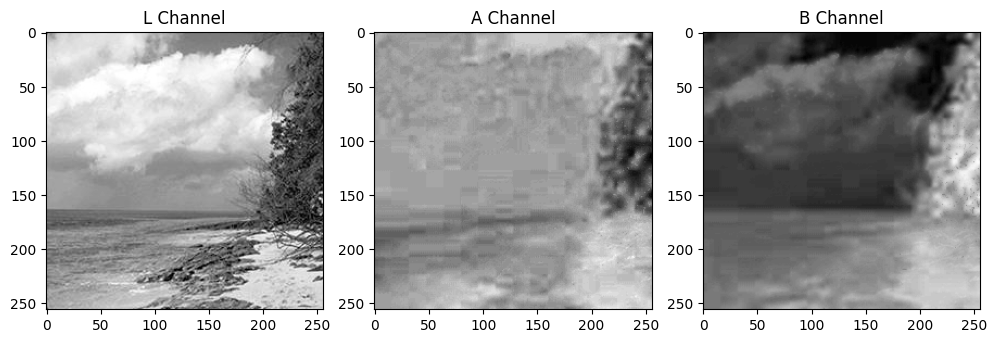

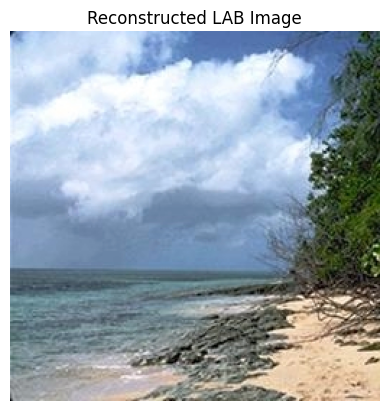

In [91]:
import cv2

# Load the image
img = cv2.imread('/kaggle/input/nsim-dataset/NSIM-dataset/images/0159.jpg')

# Convert to LAB color space
lab_image = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l_channel, a_channel, b_channel = cv2.split(lab_image)
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))

plt.subplot(131)
plt.imshow(l_channel, cmap='gray')
plt.title('L Channel')

plt.subplot(132)
plt.imshow(a_channel, cmap='gray')
plt.title('A Channel')

plt.subplot(133)
plt.imshow(b_channel, cmap='gray')
plt.title('B Channel')

plt.tight_layout()
plt.show()
reconstructed_lab_image = cv2.merge([l_channel, a_channel, b_channel])
reconstructed_rgb_image = cv2.cvtColor(reconstructed_lab_image, cv2.COLOR_LAB2BGR)

plt.imshow(cv2.cvtColor(reconstructed_rgb_image, cv2.COLOR_BGR2RGB))
plt.title('Reconstructed LAB Image')
plt.axis('off')
plt.show()


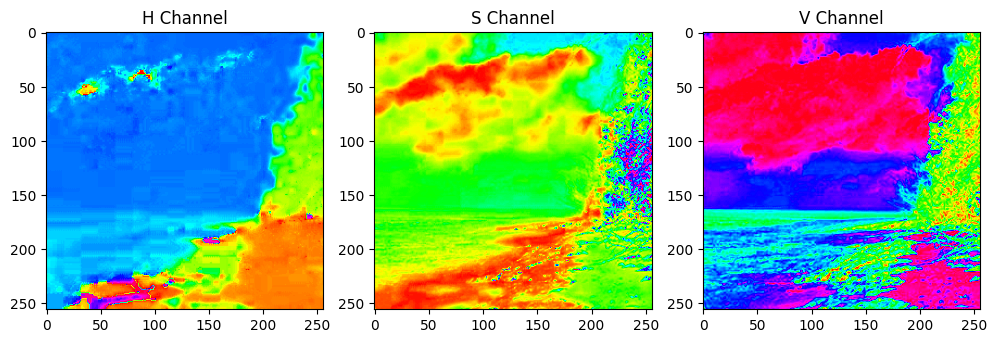

In [92]:
import cv2
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('/kaggle/input/nsim-dataset/NSIM-dataset/images/0159.jpg')

# Convert to HSV color space
hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h_channel, s_channel, v_channel = cv2.split(hsv_image)

plt.figure(figsize=(10, 5))

plt.subplot(131)
plt.imshow(h_channel, cmap='hsv')
plt.title('H Channel')

plt.subplot(132)
plt.imshow(s_channel, cmap='hsv')
plt.title('S Channel')

plt.subplot(133)
plt.imshow(v_channel, cmap='hsv')
plt.title('V Channel')

plt.tight_layout()
plt.show()


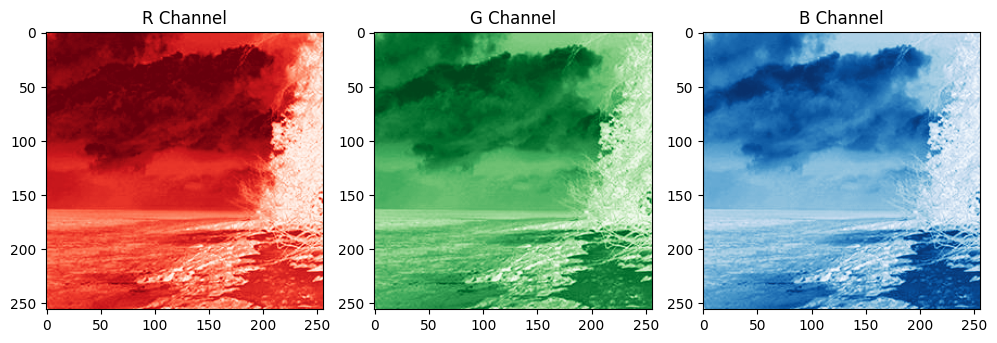

In [93]:
import cv2
import matplotlib.pyplot as plt

# Load the image
img = cv2.imread('/kaggle/input/nsim-dataset/NSIM-dataset/images/0159.jpg')

r_channel, g_channel, b_channel = cv2.split(img)

plt.figure(figsize=(10, 5))

plt.subplot(131)
plt.imshow(r_channel, cmap='Reds')
plt.title('R Channel')

plt.subplot(132)
plt.imshow(g_channel, cmap='Greens')
plt.title('G Channel')

plt.subplot(133)
plt.imshow(b_channel, cmap='Blues')
plt.title('B Channel')

plt.tight_layout()
plt.show()


In [94]:
feature_vectors.shape

(258, 4096)

In [95]:
type(feature_vectors)

numpy.ndarray

In [96]:
X.shape

(258, 150528)

In [97]:
Cdata = np.concatenate((X, feature_vectors), axis=1)

In [98]:
# Assuming 'concatenated_data' is your concatenated data
Xtr, Xte, ytr, yte = train_test_split(Cdata, actual_hrs, test_size=0.2, random_state=42)


In [99]:
SVR_model = SVR(kernel='linear', C=1.0)

In [100]:
SVR_model.fit(Xtr, ytr)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(kernel='linear')

In [101]:
from sklearn.metrics import mean_squared_error
ypred = SVR_model.predict(Xte)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(yte, ypred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.022994102271396085


In [102]:
from scipy.stats import spearmanr

# Assuming y_test and y_pred are your actual and predicted target values
spearman_corr, _ = spearmanr(yte, ypred)
print(f'Spearman Correlation: {spearman_corr}')



Spearman Correlation: -0.10667861947746021


In [103]:
yte.ravel()

array([0.48717949, 0.66176471, 0.53448276, 0.45454545, 0.65853659,
       0.57142857, 0.83333333, 0.30681818, 0.47560976, 0.58823529,
       0.31818182, 0.27419355, 0.76315789, 0.73239437, 0.4556962 ,
       0.60273973, 0.53246753, 0.484375  , 0.57971014, 0.43589744,
       0.54216867, 0.51111111, 0.575     , 0.86419753, 0.45652174,
       0.79220779, 0.35632184, 0.71084337, 0.7625    , 0.58536585,
       0.43373494, 0.50666667, 0.5       , 0.7625    , 0.70731707,
       0.52941176, 0.42682927, 0.70886076, 0.45833333, 0.41666667,
       0.46575342, 0.34615385, 0.7721519 , 0.80246914, 0.67123288,
       0.52272727, 0.48913043, 0.59259259, 0.46511628, 0.63043478,
       0.47368421, 0.59493671])

In [105]:

from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [106]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score

# Define a grid of hyperparameters to search
param_C = [0.1, 1, 10]
param_epsilon = [0.1, 0.01, 0.001]

best_r2 = 0  # Initialize best R2 score
best_params = None

for C in param_C:
    for epsilon in param_epsilon:
        # Initialize and train SVR model
        svr_Model = SVR(kernel='linear', C=C, epsilon=epsilon)
        svr_Model.fit(Xtr, ytr.ravel())

        # Predict and evaluate
        y_PRED = svr_Model.predict(Xte)
        r2 = r2_score(yte, y_PRED)

        # Check if this set of hyperparameters is the best so far
        if r2 > best_r2:
            best_r2 = r2
            best_params = {'C': C, 'epsilon': epsilon}

if best_params is not None:
    # Initialize and train SVR model with best hyperparameters
    best_svr = SVR(kernel='linear', C=best_params['C'], epsilon=best_params['epsilon'])
    best_svr.fit(Xtr, ytr)

    # Predict and evaluate with the best model
    y_pred_tuned = best_svr.predict(Xte)
    r2_tuned = r2_score(yte, y_pred_tuned)

    print(f'Best R-squared (R2) Score: {best_r2}')
    print(f'Best Hyperparameters: {best_params}')
    print(f'R-squared (R2) Score with Best Hyperparameters: {r2_tuned}')
else:
    print("No suitable hyperparameters found.")


No suitable hyperparameters found.


# **CONCLUSION**
***The predictability of memorability for natural scene images is a complex task influenced by a multitude of factors. Through rigorous experimentation and analysis, it becomes evident that achieving high accuracy in predicting the memorability of these images is a challenging endeavor.***

**LOW level Features**

* Color Histograms
* Texture Descriptors
* Edge Detection
* Intensity Histograms 

**MID Level Features**

* Contours and Boundaries
* Histograms of Oriented Gradients (HOG)
* Region-based Color Descriptors
* Scale-Invariant Feature Transform (SIFT)

**HIGH Level Features**

* Object Categories
* Scene Classification
* Semantic Segmentation
* Object Relationships and Context
* Spatial Layout

A complex Architecture which can capture deep features of Natural scene images will provide better results when concatenated with scene classification or high level features 